# Analysis of OSM tags

## TODO: ADD EXPLANATION HERE

In [24]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pickle
import json
import pandas as pd
import seaborn as sns
import plotly.express as px
import pandas as pd
from pysal.explore import esda
from pysal.lib import weights
from splot.esda import lisa_cluster

from src import evaluation_functions as eval_func

%run ../settings/yaml_variables.py
%run ../settings/df_styler.py
%run ../settings/plotting.py
%run ../settings/load_osmdata.py
%run ../settings/paths.py

OSM data loaded successfully!


In [25]:
# Read intrinsic grid results
with open(
    f"../results/OSM/{study_area}/data/grid_results_intrinsic.pickle", "rb"
) as fp:
    osm_intrinsic_grid = pickle.load(fp)

osm_intrinsic_grid.dropna(subset='count_osm_edges',inplace=True)

# Import intrinsic results
osm_intrinsic_file = open(
    f"../results/OSM/{study_area}/data/intrinsic_analysis.json"
)

osm_intrinsic_results = json.load(osm_intrinsic_file)

# Import summary dataframe
summarize_results_df = pd.read_csv(f"../results/OSM/{study_area}/data/intrinsic_summary_results.csv",index_col=0)

summarize_results_df.style.pipe(format_osm_style)

,
Total infrastructure length (km),"20,681"
Protected bicycle infrastructure density (m/km2),386
Unprotected bicycle infrastructure density (m/km2),60
Mixed protection bicycle infrastructure density (m/km2),1
Bicycle infrastructure density (m/km2),446
Nodes,"90,804"
Dangling nodes,"46,426"
Nodes per km2,2
Dangling nodes per km2,1
Incompatible tag combinations,37


## Spatial patterns in existing tags

This section analyzes the spatial distribution of share of bicycle edges *with* the relevant OSM tags added.

In [26]:
variable_names = ['surface','width','speedlimit','lit'] # Update if other tag types have been analyzed when running BikeDNA

for v in variable_names:

    rename_dict = {
        f"existing_tags_{v}_length_pct_missing": f"{v}_length_pct_missing",
        f"existing_tags_{v}_count_pct_missing" : f"{v}_count_pct_missing",
        f"existing_tags_{v}_length_pct" : f"{v}_length_pct",
        f"existing_tags_{v}_count_pct" : f"{v}_count_pct",
    }

    osm_intrinsic_grid.rename(rename_dict,inplace=True,axis=1)

/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/lib/weights/weights.py:170: UserWarning:

The weights matrix is not fully connected. There are 21 components



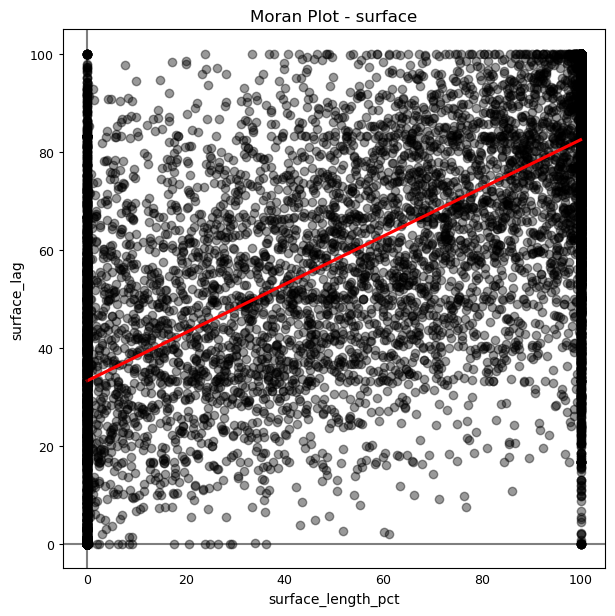

With significance 0.001, the Moran's I value for surface is 0.49


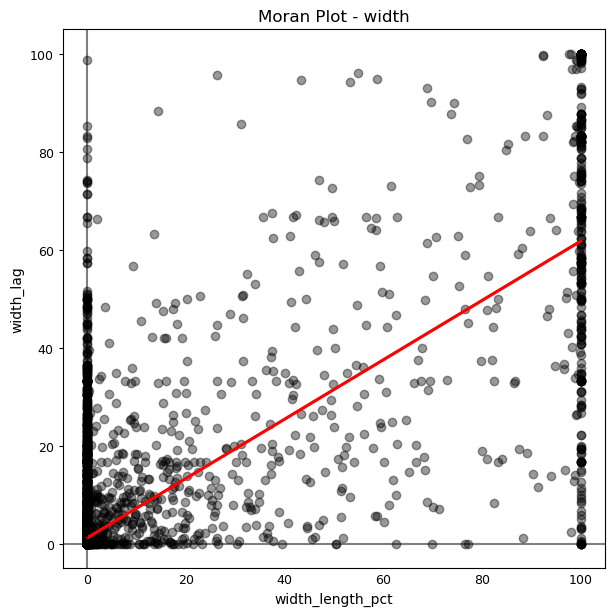

With significance 0.001, the Moran's I value for width is 0.61


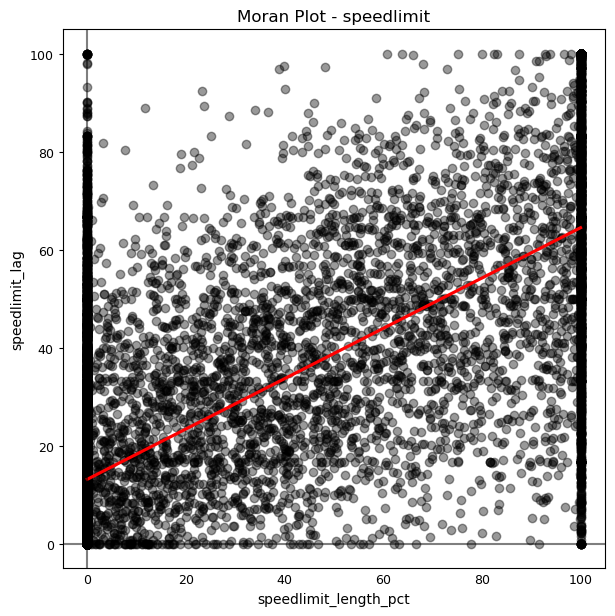

With significance 0.001, the Moran's I value for speedlimit is 0.51


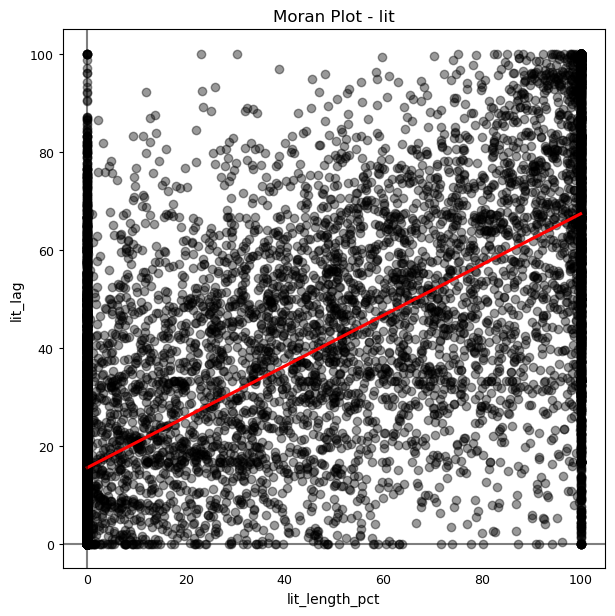

With significance 0.001, the Moran's I value for lit is 0.52


In [27]:
pct_length_existing = [f"{v}_length_pct" for v in variable_names]

col_names = pct_length_existing

filepaths = [osm_analysis_fp+f"morans_{v}_length.png" for v in variable_names]

w = eval_func.compute_spatial_weights(osm_intrinsic_grid, ["count_osm_edges"], "knn")

morans_tags = eval_func.compute_spatial_autocorrelation(col_names, variable_names, osm_intrinsic_grid, w, filepaths)

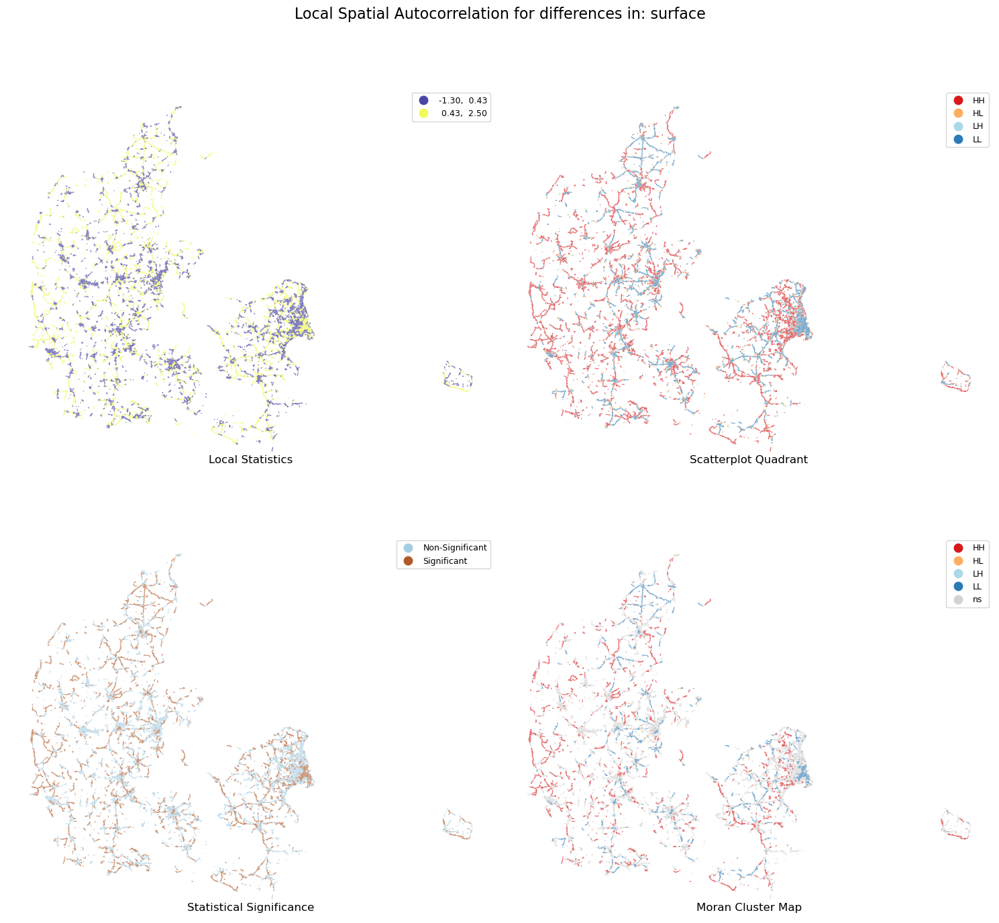

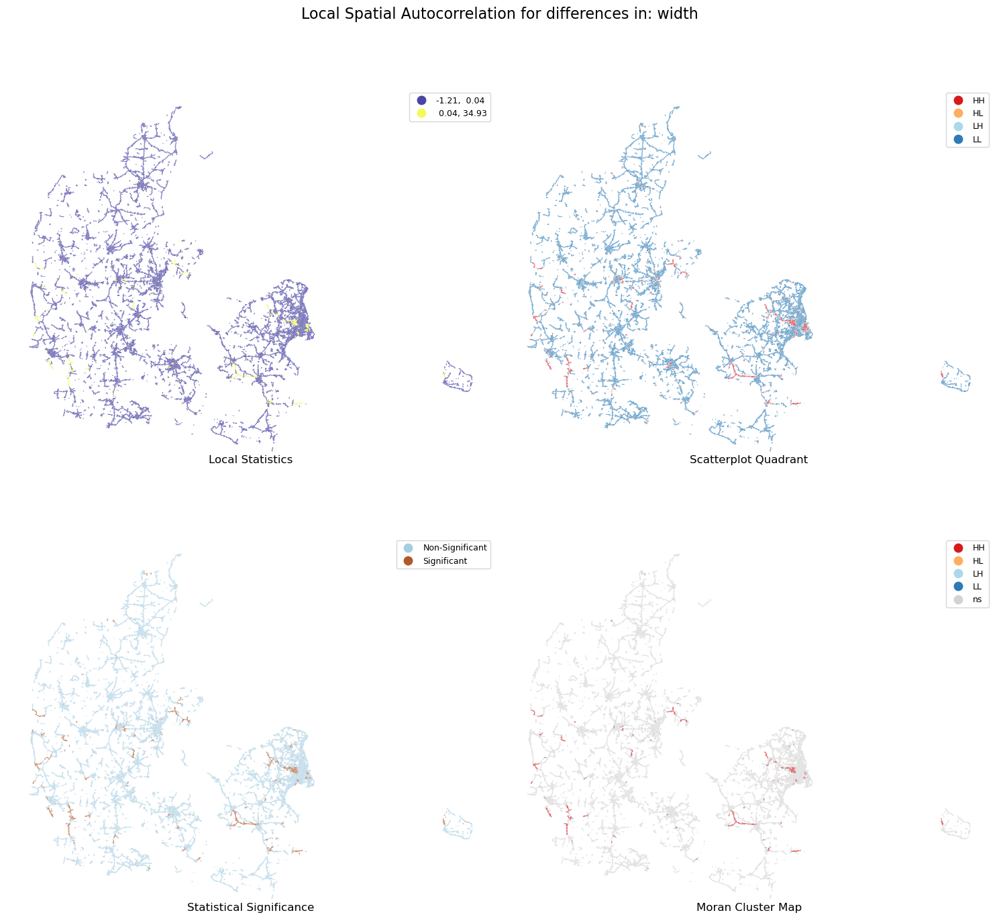

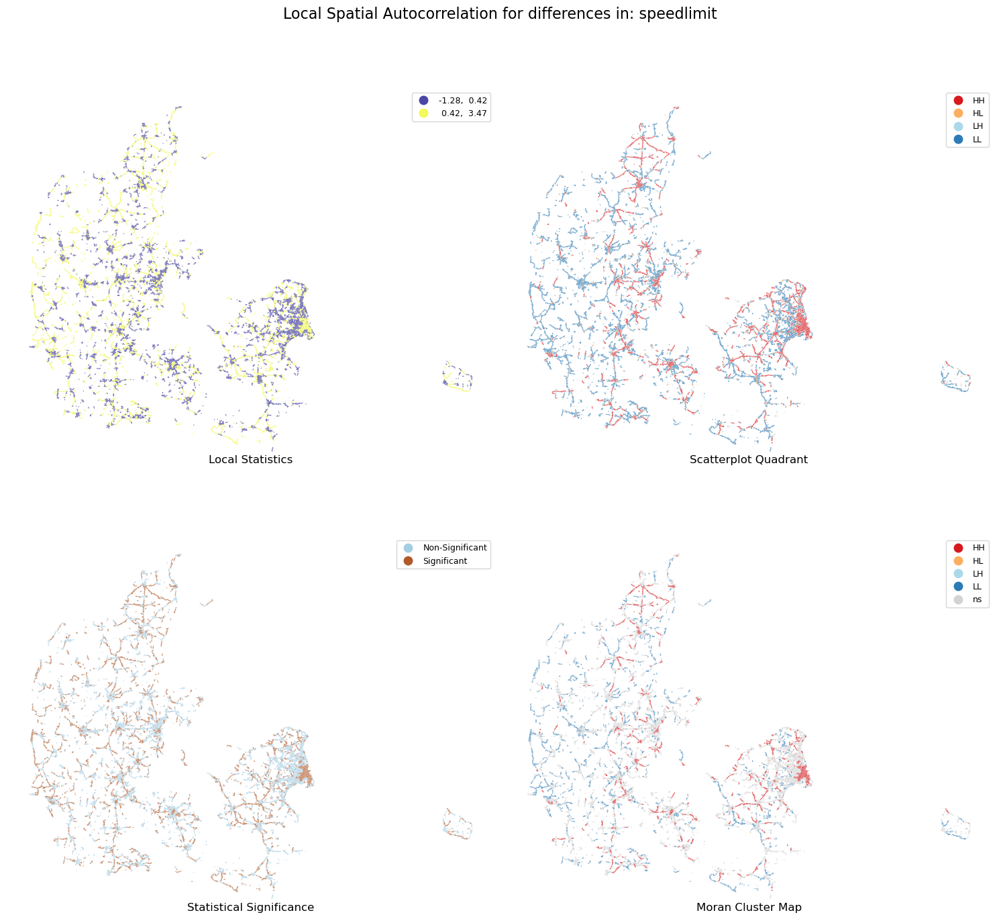

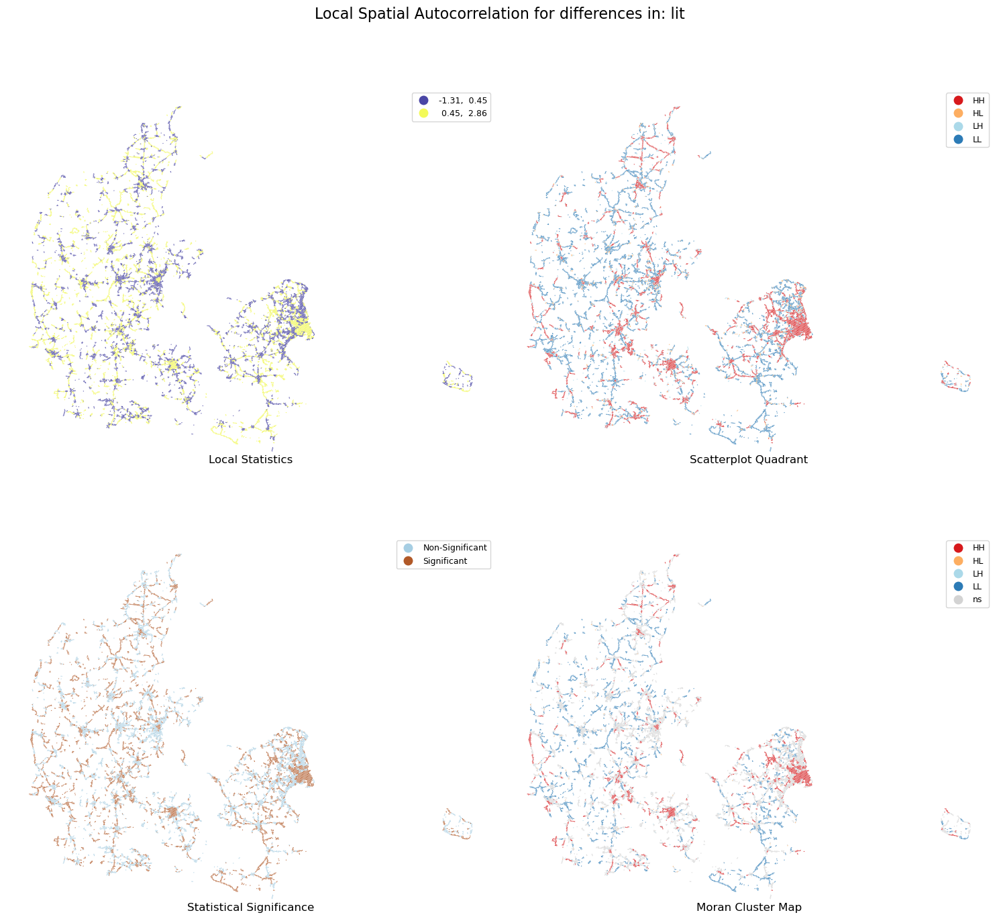

In [28]:
col_names = pct_length_existing

filepaths = [osm_analysis_fp+f"lisa_{v}_length.png" for v in variable_names]

lisas_tags = eval_func.compute_lisa(col_names, variable_names, osm_intrinsic_grid, w,filepaths)

In [29]:
for v in variable_names:
    hotspot = len(osm_intrinsic_grid[osm_intrinsic_grid[f"{v}_q"]=="HH"])
    coldspot = len(osm_intrinsic_grid[osm_intrinsic_grid[f"{v}_q"]=="LL"])

    print(f"For the tag '{v}', {hotspot} out of {len(osm_intrinsic_grid)} grid cells ({hotspot/len(osm_intrinsic_grid)*100:.2f}%) are part of a hotspot (based on the length of edges with a given tag).")
    print(f"For the tag '{v}', {coldspot} out of {len(osm_intrinsic_grid)} grid cells ({coldspot/len(osm_intrinsic_grid)*100:.2f}%) are part of a coldspot (based on the length of edges with a given tag).")
    print("\n")

For the tag 'surface', 3518 out of 14506 grid cells (24.25%) are part of a hotspot (based on the length of edges with a given tag).
For the tag 'surface', 2381 out of 14506 grid cells (16.41%) are part of a coldspot (based on the length of edges with a given tag).


For the tag 'width', 522 out of 14506 grid cells (3.60%) are part of a hotspot (based on the length of edges with a given tag).
For the tag 'width', 6 out of 14506 grid cells (0.04%) are part of a coldspot (based on the length of edges with a given tag).


For the tag 'speedlimit', 2254 out of 14506 grid cells (15.54%) are part of a hotspot (based on the length of edges with a given tag).
For the tag 'speedlimit', 3037 out of 14506 grid cells (20.94%) are part of a coldspot (based on the length of edges with a given tag).


For the tag 'lit', 2474 out of 14506 grid cells (17.06%) are part of a hotspot (based on the length of edges with a given tag).
For the tag 'lit', 3772 out of 14506 grid cells (26.00%) are part of a cold

In [30]:
lit_hot = len(osm_intrinsic_grid.loc[osm_intrinsic_grid.lit_q=='HH'])
surface_cold = len(osm_intrinsic_grid.loc[osm_intrinsic_grid.surface_q=='LL'])
both = len(osm_intrinsic_grid.loc[(osm_intrinsic_grid.lit_q=='HH') & (osm_intrinsic_grid.surface_q=='LL')])

print(f"Out of {lit_hot} cells in a lit hotspot and {surface_cold} cells in a surface cold spot, {both} cells are both in a lit hot spot and surface cold spot (based on the length of edges with a given tag).")

Out of 2474 cells in a lit hotspot and 2381 cells in a surface cold spot, 904 cells are both in a lit hot spot and surface cold spot (based on the length of edges with a given tag).


In [31]:
# Export
q_cols = [v+'_q' for v in variable_names]
q_cols.append("hex_id")
osm_intrinsic_grid[q_cols].to_csv(osm_analysis_fp + "tags_spatial_autocorrelation.csv",index=False)

## Correlations between missing tags

### TODO- explain looking at pct

### TODO: explain why drop

In [32]:
length_missing = [f"{v}_length_pct_missing" for v in variable_names]

count_missing = [f"{v}_count_pct_missing" for v in variable_names]

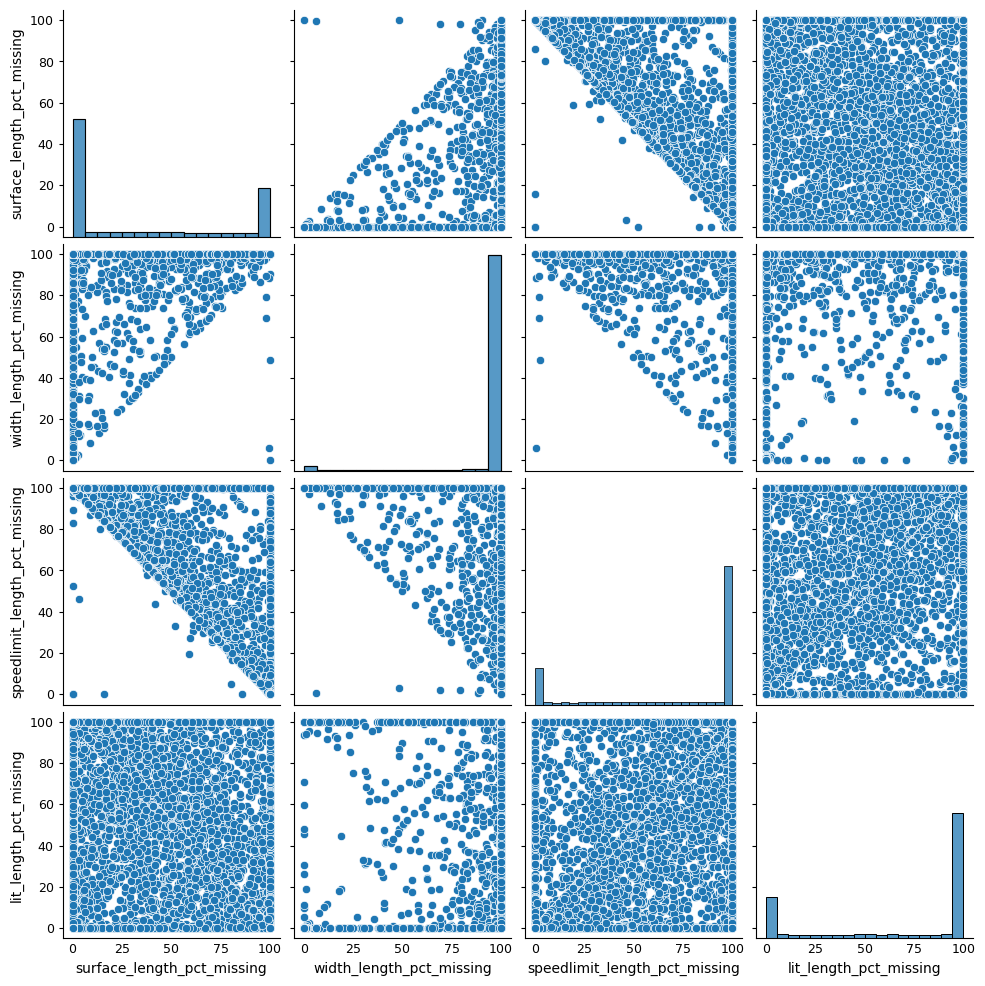

In [33]:
sns.pairplot(osm_intrinsic_grid[length_missing].dropna()); # To not have the plot cluttered by areas where ALL 

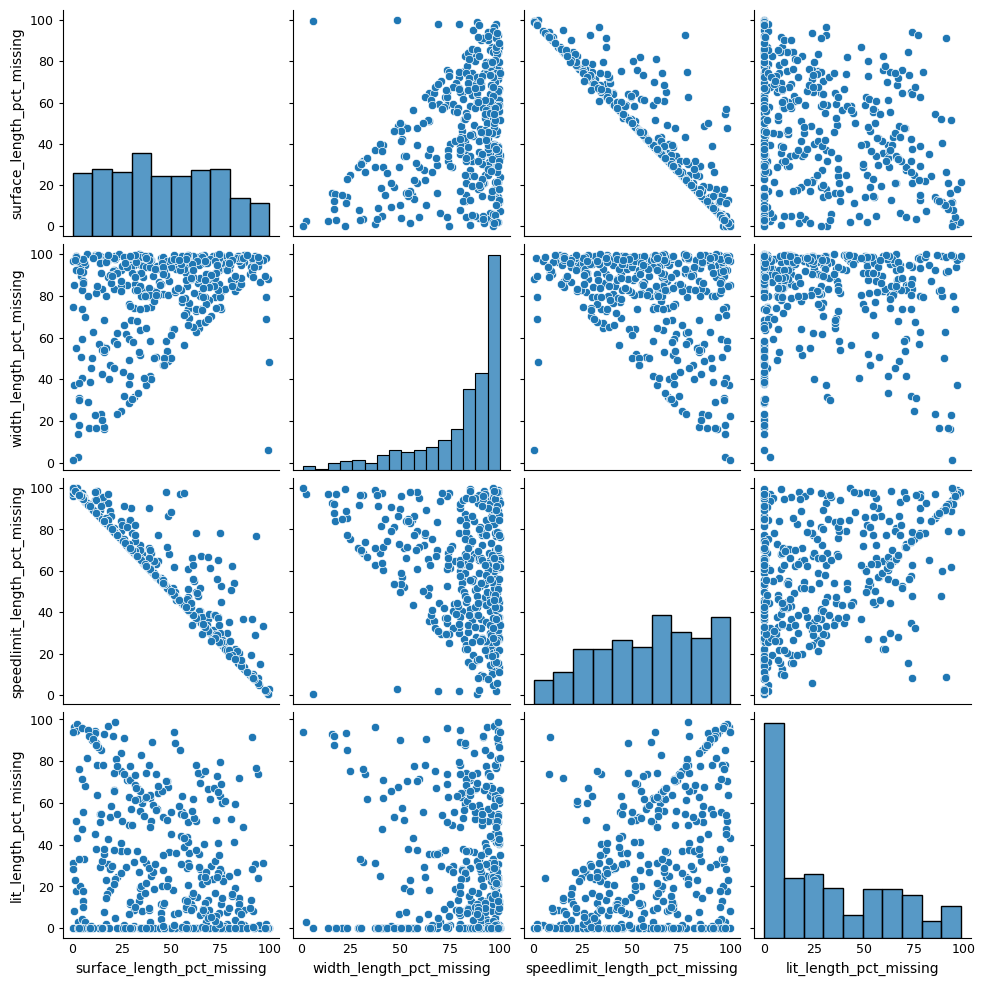

In [34]:
# To not have the plot cluttered by areas where ALL edges are missing a tag, only include those with less than 100% missing

sns.pairplot(osm_intrinsic_grid[osm_intrinsic_grid[length_missing]<100][length_missing].dropna());

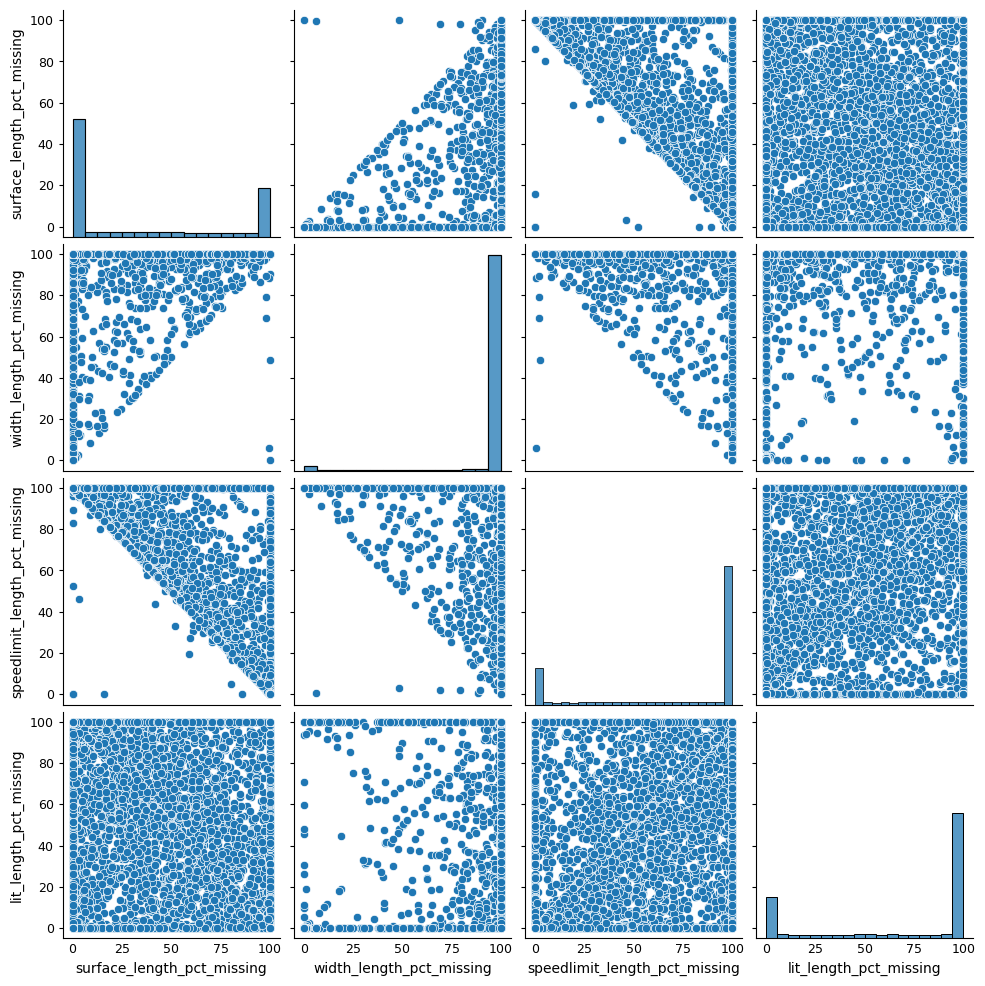

In [35]:
sns.pairplot(osm_intrinsic_grid[length_missing].dropna()); 

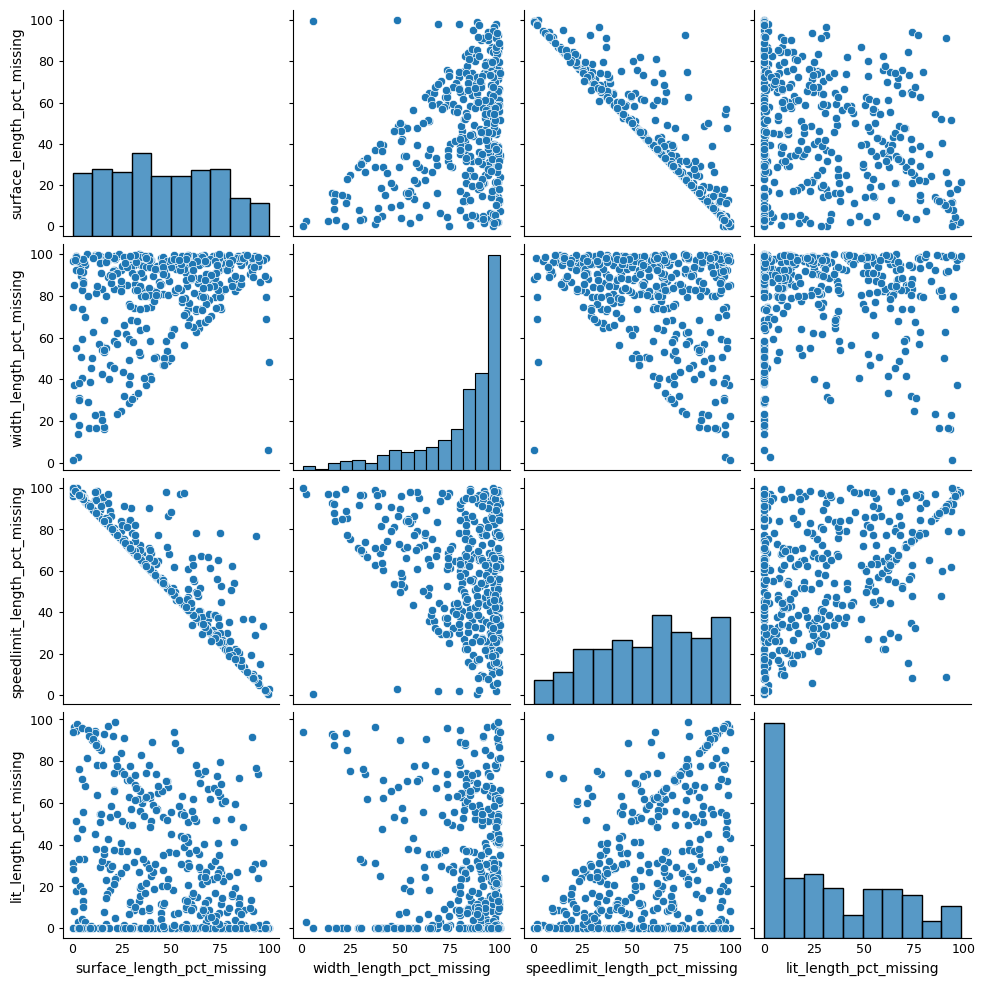

In [36]:
sns.pairplot(osm_intrinsic_grid[osm_intrinsic_grid[length_missing]<100][length_missing].dropna()); 

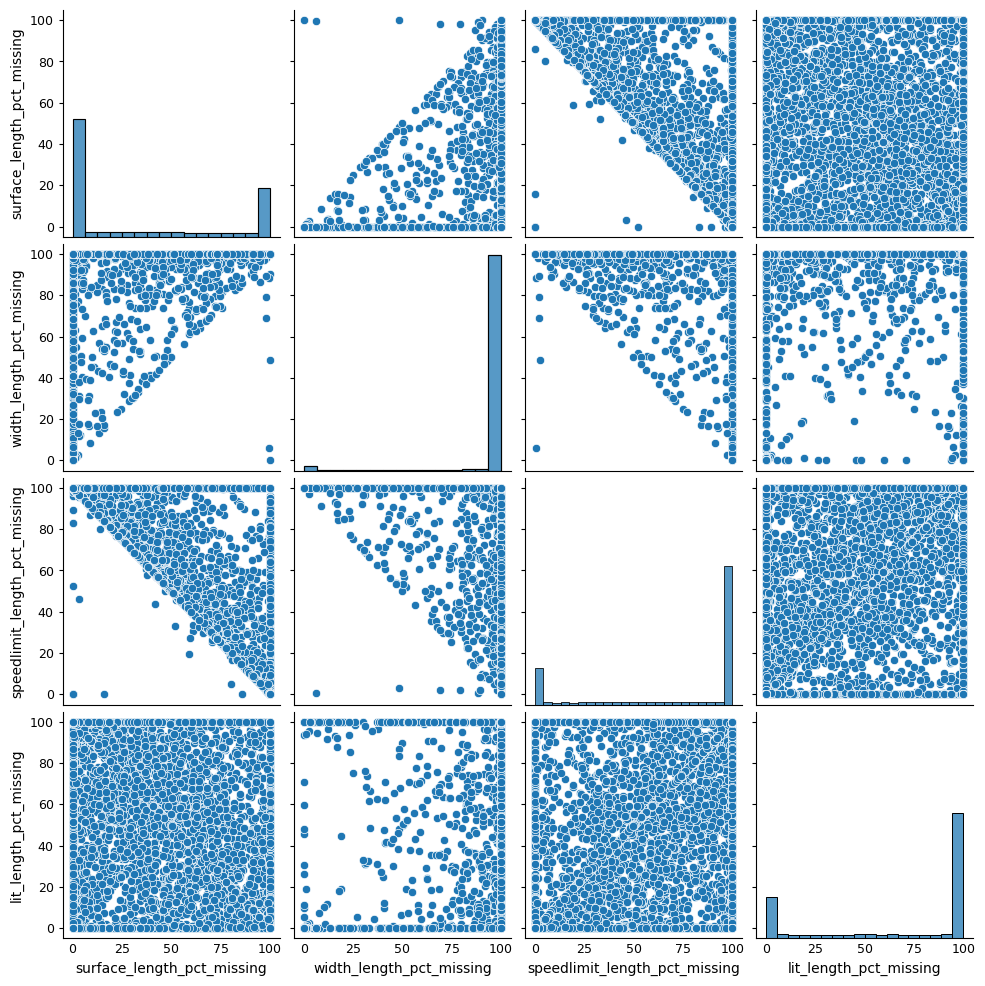

In [37]:
sns.pairplot(osm_intrinsic_grid[length_missing].dropna());

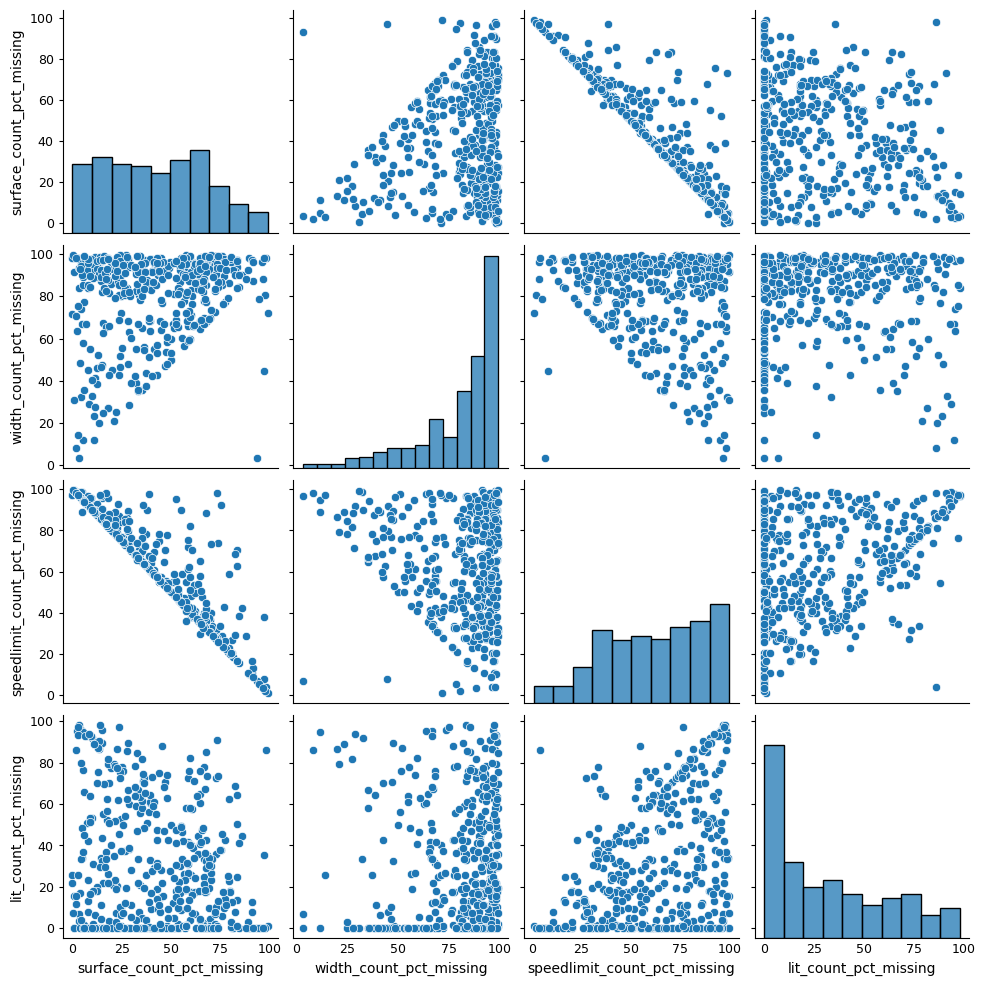

In [38]:
sns.pairplot(osm_intrinsic_grid[osm_intrinsic_grid[count_missing]<100][count_missing].dropna());

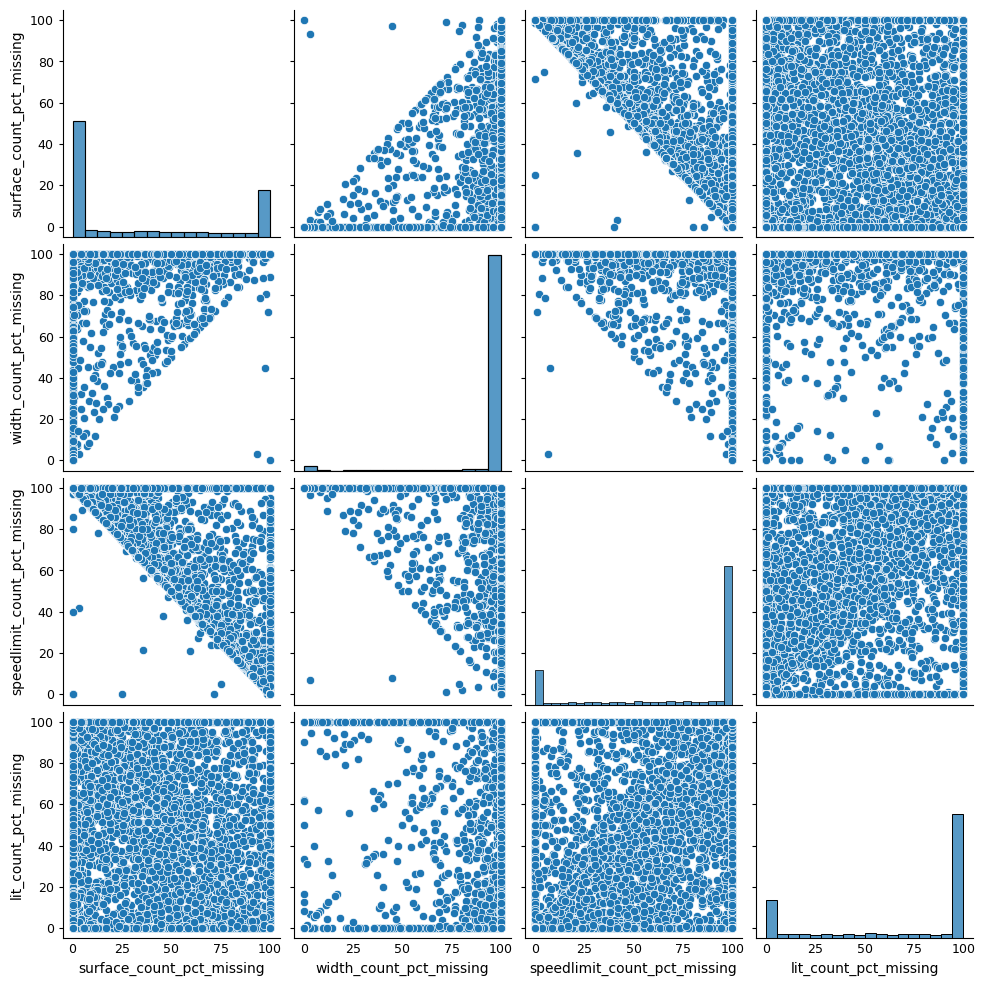

In [39]:
sns.pairplot(osm_intrinsic_grid[count_missing].dropna());

### Correlation between selected missing tags and edge density

The plots below explore the relationship between the share of edges missing a given tag with edge density as a third variable.

OBS: Variable names are hardcoded here.

In [40]:
fig = px.scatter(
    osm_intrinsic_grid, 
    x='surface_count_pct_missing', 
    y='speedlimit_count_pct_missing',
    color="osm_edge_density",
    title='Correlation between missing tags', 
    color_continuous_scale='viridis_r',
    labels={
        "osm_edge_density": "edge density (m/sqkm)",
        "speedlimit_count_pct_missing": "Pct edges without speedlimit tag",
        "surface_count_pct_missing": "Pct edges without surface tag",
        })

fig.update_layout(
    font=dict(
        size=12,
        color="RebeccaPurple"
    )
)
fig.show()

In [41]:
fig = px.scatter(
    osm_intrinsic_grid, 
    x='surface_count_pct_missing', 
    y='lit_count_pct_missing',
    color="osm_edge_density",
    title='Correlation between missing tags', 
    color_continuous_scale='viridis_r',
    labels={
        "osm_edge_density": "edge density (m/sqkm)",
        "speedlimit_count_pct_missing": "Pct edges without speedlimit tag",
        "surface_count_pct_missing": "Pct edges without surface tag",
        "lit_count_pct_missing": "Pct edges without lit tag",
        })

fig.update_layout(
    font=dict(
        size=12,
        color="RebeccaPurple"
    )
)
fig.show()

## Correlation between missing tags & population density

### TODO: ADD EXPLANATION

In [43]:
pop_grid = gpd.read_parquet(pop_processed_fp + f"h3_population_polygons_{study_area}.parquet")

joined_grid = osm_intrinsic_grid.merge(pop_grid[['hex_id','pop_dens']],on="hex_id",how="inner")

assert len(joined_grid) == len(osm_intrinsic_grid)

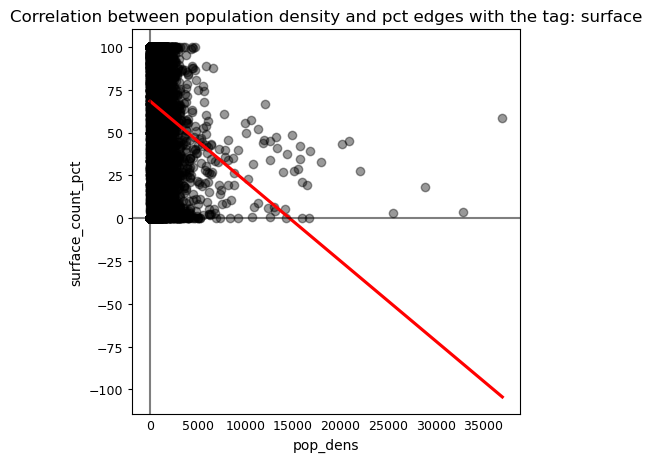

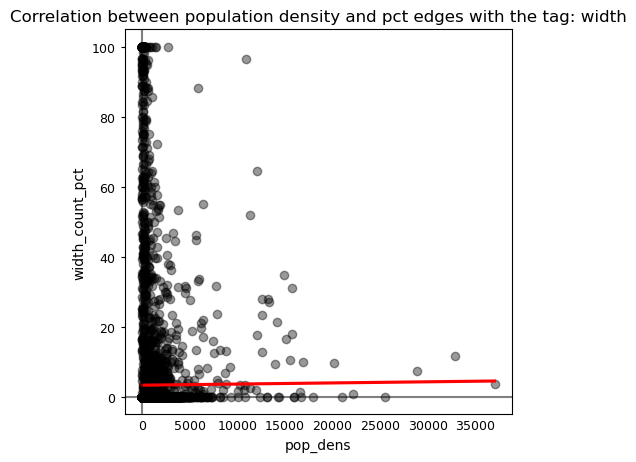

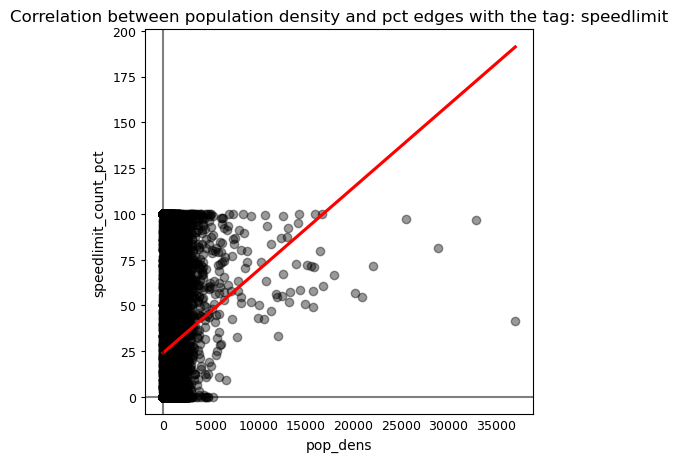

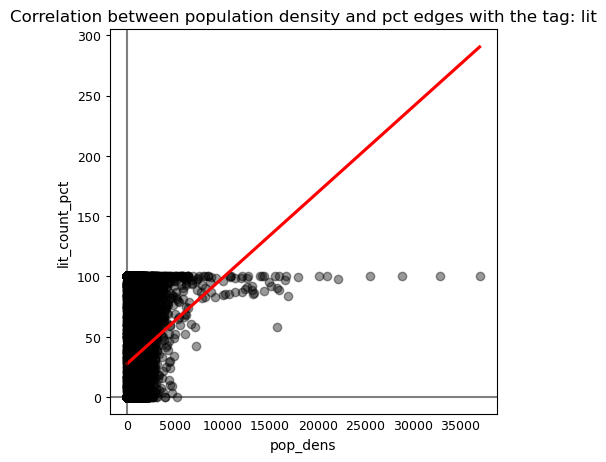

In [44]:
# TODO: avoid hardcoding

tag_types = ["surface", "width", "speedlimit", "lit"]

length_cols = [
    "surface_length_pct",
    "width_length_pct",
    "speedlimit_length_pct",
    "lit_length_pct",
]

count_cols = [
    "surface_count_pct",
    "width_count_pct",
    "speedlimit_count_pct",
    "lit_count_pct",
]

for i, t in enumerate(tag_types):
    f, ax = plt.subplots(1, figsize=(5,5))

    sns.regplot(
        x="pop_dens",
        y=count_cols[i],
        ci=None,
        data=joined_grid,
        line_kws={"color": "r"},
        scatter_kws={"alpha": 0.4},
        color="black",
    )

    ax.axvline(0, c="k", alpha=0.5)
    ax.axhline(0, c="k", alpha=0.5)
    ax.set_title(
        f"Correlation between population density and pct edges with the tag: {t}"
    )
    plt.show()


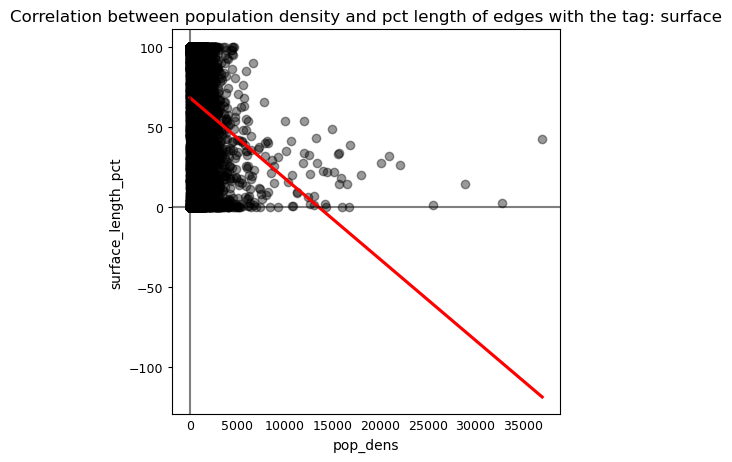

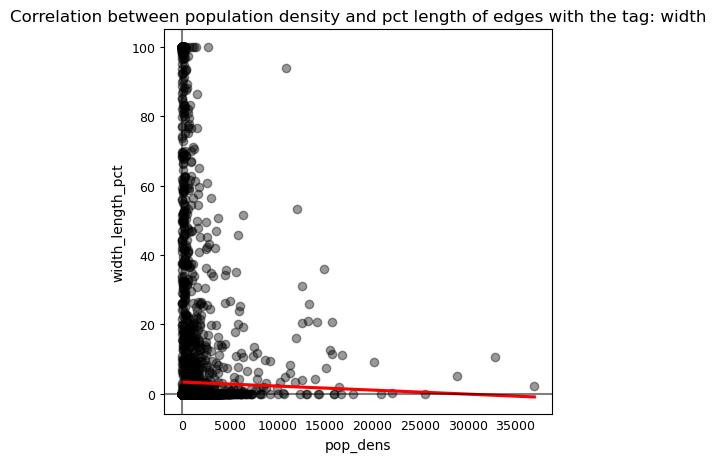

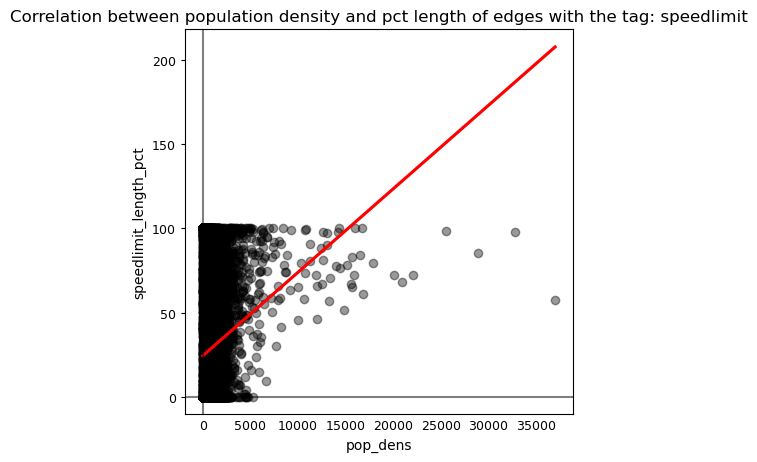

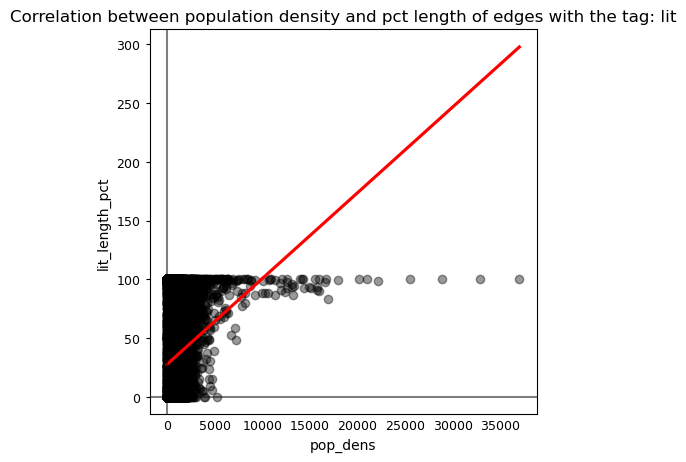

In [45]:

for i, t in enumerate(tag_types):
    f, ax = plt.subplots(1, figsize=(5,5))

    sns.regplot(
        x="pop_dens",
        y=length_cols[i],
        ci=None,
        data=joined_grid,
        line_kws={"color": "r"},
        scatter_kws={"alpha": 0.4},
        color="black",
    )

    ax.axvline(0, c="k", alpha=0.5)
    ax.axhline(0, c="k", alpha=0.5)
    ax.set_title(f"Correlation between population density and pct length of edges with the tag: {t}")
    plt.show()